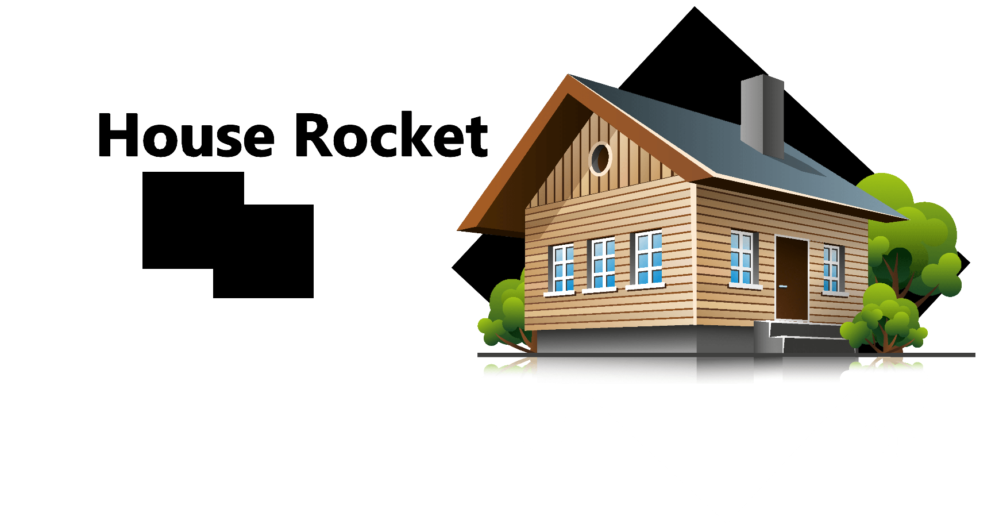

<p style="text-align:center;"><i>"House Rocket" é uma plataforma digital que tem como modelo de negócio, a compra e a venda de imóveis usando tecnologiaque compra e venda apartamentos na região de 'Seattle' nos Estados Unidos.</i></p>

Você é um Data Scientist contrato pela empresa para ajudar a encontrar as melhores oportunidades de negócio no mercado de imóveis. O CEO da House Rocket gostaria de maximizar a receita da empresa encontrando boas oportunidades de negócio.

Sua principal estratégia é comprar boas casas em ótimas localizações com preços baixos e depois revendê-las posteriormente à preços mais altos. Quanto maior a diferença entre a compra e a venda, maior o lucro da empresa e portanto maior sua receita.

Entretanto, as casas possuem muitos atributos que as tornam mais ou menos atrativas aos compradores e vendedores e a localização e o período do ano também podem influenciar os preços.

In [1]:
using CSV
using Dates
using Printf
using PyPlot
using PyCall
using DataFrames
using Statistics

include("../utils.jl")

np = pyimport("numpy")
pd = pyimport("pandas")
ss = pyimport("scipy.stats");
sns = pyimport("seaborn");

## 0.1. Aux Functions

In [2]:
plt.rcParams["figure.figsize"] = [20, 15]
plt.rcParams["font.size"] = 10;

In [ ]:
df = DataFrame(CSV.File("../data/kc_house_data.csv"));

# 1.0. Descriptive Statistical 

In [4]:
first(df, 5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot
,Int64,String15,Float64,Int64,Float64,Int64,Int64
1,7129300520,20141013T000000,221900.0,3,1.0,1180,5650
2,6414100192,20141209T000000,538000.0,3,2.25,2570,7242
3,5631500400,20150225T000000,180000.0,2,1.0,770,10000
4,2487200875,20141209T000000,604000.0,4,3.0,1960,5000
5,1954400510,20150218T000000,510000.0,3,2.0,1680,8080


## 1.1. Rename Columns

In [5]:
# names(df) have snake_case

## 1.2. Data Dimension

In [25]:
@printf "Number of Columns: %d" size(df)[2]
@printf "\nNumber of Rows: %d" size(df)[1]

Number of Columns: 21
Number of Rows: 21613

## 1.3. Check Data Types

In [45]:
DataFrame(name=names(df), type=eltype.(eachcol(df)))

,name,type
,String,DataType
1,id,Int64
2,date,String15
3,price,Float64
4,bedrooms,Int64
5,bathrooms,Float64
6,sqft_living,Int64
7,sqft_lot,Int64
8,floors,Float64
9,waterfront,Int64


In [5]:
df.date = [p[1:8] for p in df.date];
df.date = [Date(parse(Int64, p[1:4]), parse(Int64, p[5:6]), parse(Int64, p[7:end])) for p in df.date];

## 1.4. Check Na

In [6]:
filter(ismissing, df)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront
,Int64,Date,Float64,Int64,Float64,Int64,Int64,Float64,Int64


## 1.5. Fillout Na

In [7]:
# Do not have NA Values

## 1.6. Change Data Types

In [8]:
DataFrame(name=names(df), type=eltype.(eachcol(df)))

,name,type
,String,DataType
1,id,Int64
2,date,Date
3,price,Float64
4,bedrooms,Int64
5,bathrooms,Float64
6,sqft_living,Int64
7,sqft_lot,Int64
8,floors,Float64
9,waterfront,Int64


## 1.7. Descriptive Statistical

### 1.7.1. Numerical Attributes

In [15]:
results = split_attributes(df);

In [16]:
describe(results["Num Df"])

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,id,4.5803e9,1000102,3.90493e9,9900000190,0,Int64
2,bedrooms,3.37084,0,3.0,33,0,Int64
3,sqft_living,2079.9,290,1910.0,13540,0,Int64
4,sqft_lot,15107.0,520,7618.0,1651359,0,Int64
5,waterfront,0.00754176,0,0.0,1,0,Int64
6,view,0.234303,0,0.0,4,0,Int64
7,condition,3.40943,1,3.0,5,0,Int64
8,grade,7.65687,1,7.0,13,0,Int64
9,sqft_above,1788.39,290,1560.0,9410,0,Int64


# 2.0. Feature Engineering 

In [17]:
df2 = df;

## 2.1. Mind Map

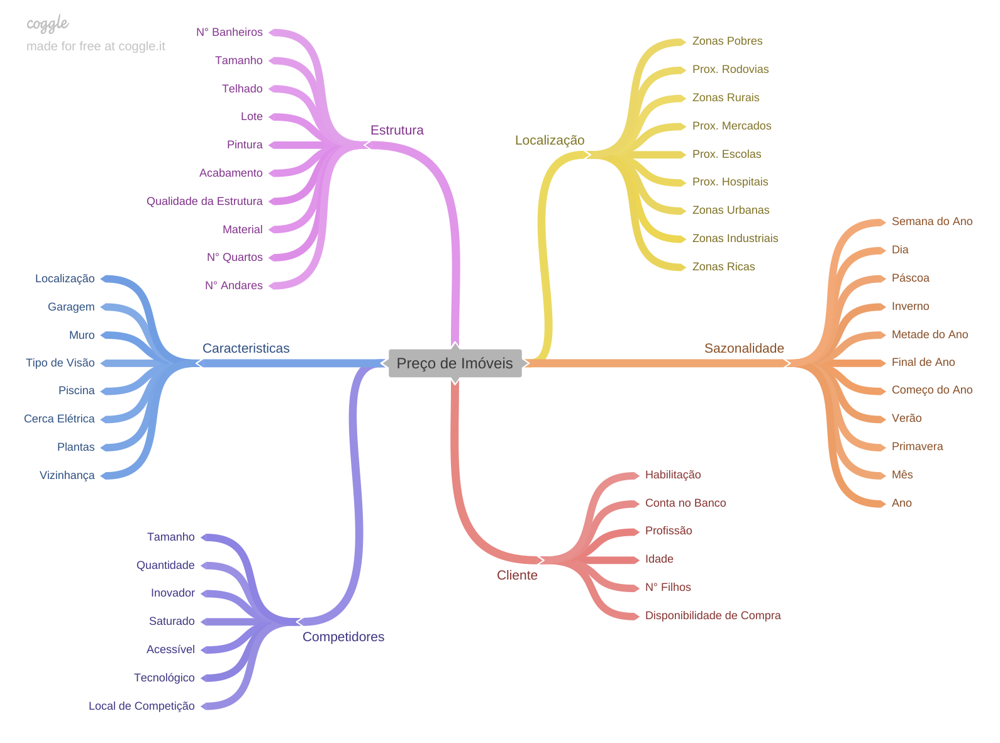

## 2.2. Hypotesis List

**H1.** Casas com vista para a agua possuem uma mediana de preço maior.

**H2.** Casas vendidas em feriados natalinos vendem mais.

**H3.** Os preços das casas cresçe a cada ano. 

**H4.** Casas com condições melhores possuem uma média de preço maior.

**H5.** Casas com mais de dois andares possuem uma mediana de preço maior.

**H6.** Casas contruidas antes do século XXI possuem uma mediana de preço menor 

**H7.** Casas com porão representam mais de 50% do preços da casas.

## 2.3. Feature Engineering

In [18]:
df2[!, "year"]        = [Dates.year(p) for p in df2.date]
df2[!, "month"]       = [Dates.month(p) for p in df2.date]
df2[!, "day"]         = [Dates.day(p) for p in df2.date]
df2[!, "day_of_week"] = [Dates.dayofweek(p) for p in df2.date]
df2[!, "week"]        = [Dates.week(p) for p in df2.date]
df2[!, "day_name"]    = [Dates.dayname(p) for p in df2.date]
df2[!, "month_name"]  = [Dates.monthname(p) for p in df2.date];

# 3.0. Dataset Filtering

**First Cycle Filtering**

In [20]:
df3 = df2;

In [29]:
df3 = df3[:, 3:end];

# 4.0. Exploratory Data Analysis

In [5]:
df4 = DataFrame(CSV.File("../data/df3.csv"));

## 4.1. Univariable Analysis

### 4.1.1. Response Variable

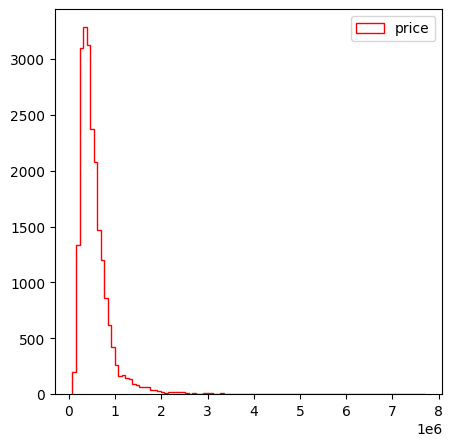

In [27]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.hist(df4.price, label="price", color="r", histtype="step", bins=100);
plt.legend();

### 4.1.2. Numerical Variables

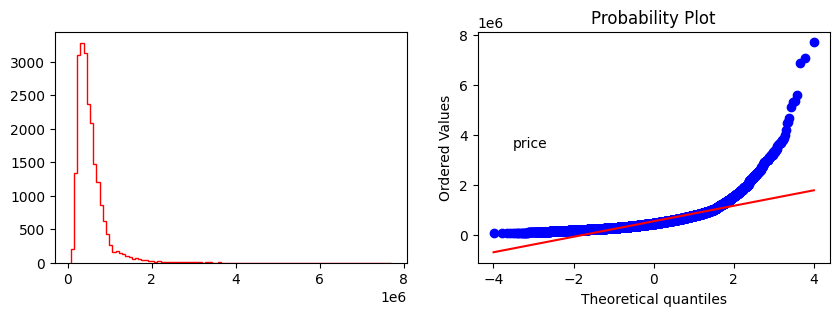

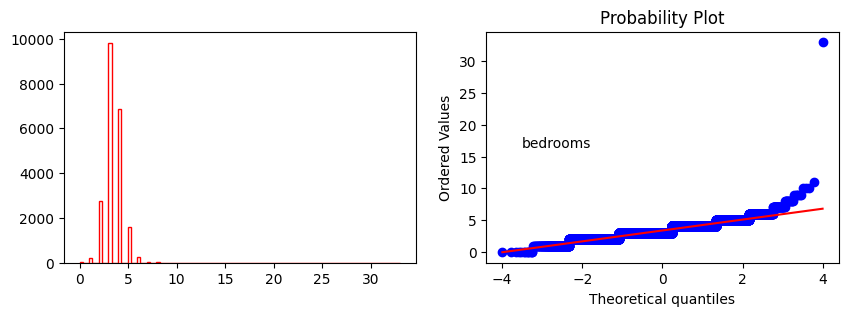

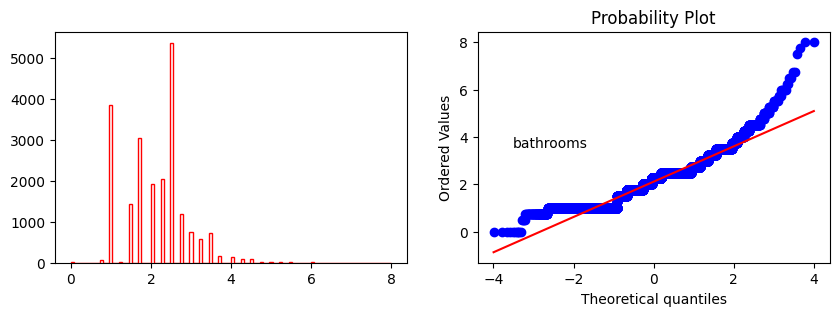

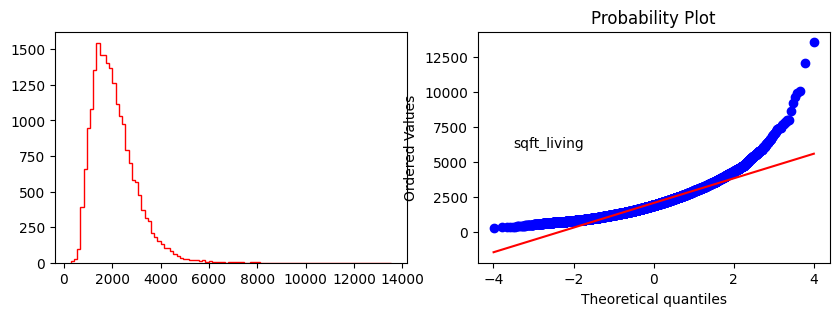

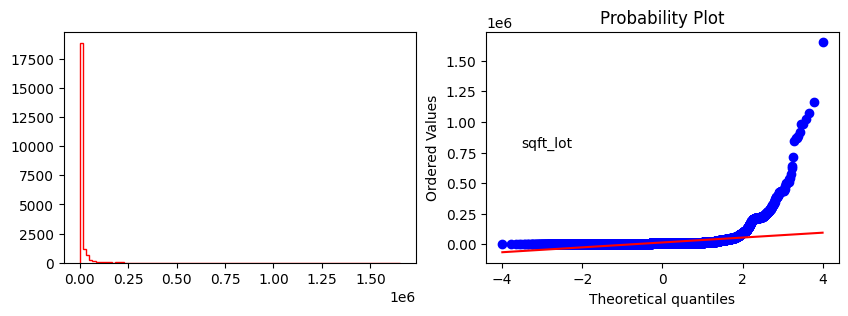

...

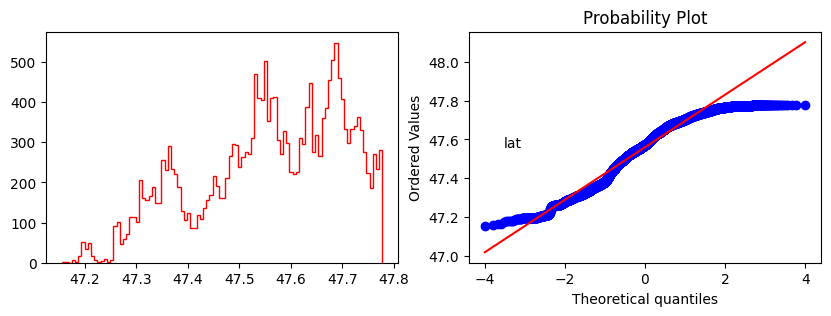

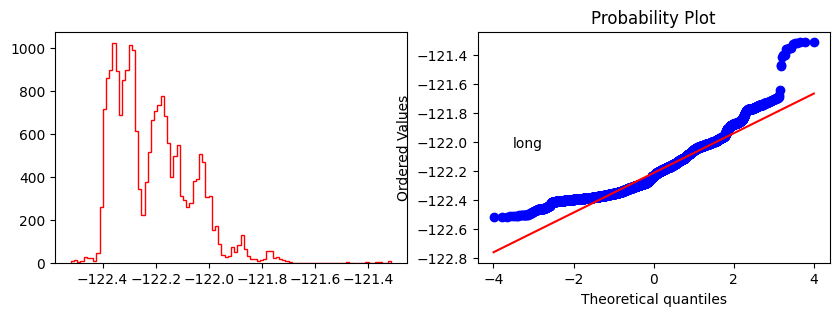

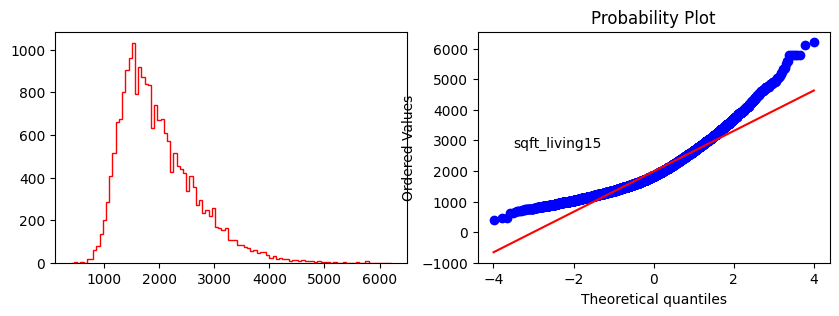

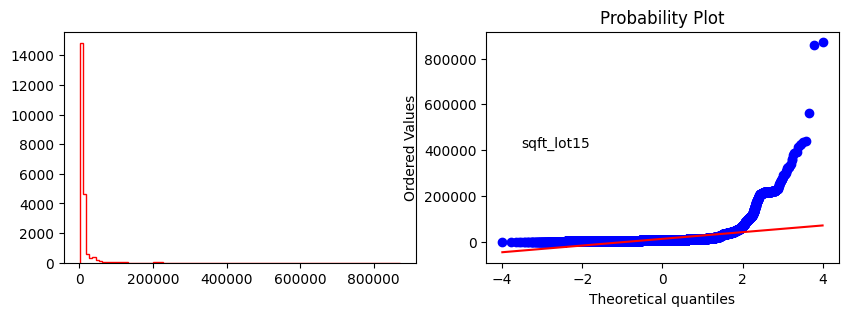

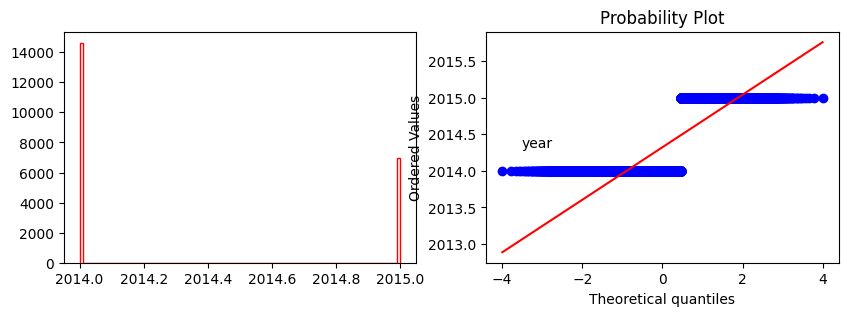

In [146]:
for k in names(df4)[1:20]
    plot_hist_info(df4, k)
end

## 4.2. Bivariable Analysis

### **H1.** Casas com vista para a agua possuem uma mediana de preço maior.
**Falsa** Existem algumas casas que não tem visão para a água e possuem um preço maior.

In [364]:
ks, p = ss.kruskal(df4[df4.waterfront .== 0, :].price, df4[df4.waterfront .== 1, :].price)
ks, p2 = ss.kruskal(df4[df4.waterfront .== 0, "price"][21250:end], df4[df4.waterfront .== 1, :].price)
@printf "P-Value: %f" p
@printf "\nP-Value Rich Houses: %f" p2

P-Value: 0.000000
P-Value Rich Houses: 0.000000

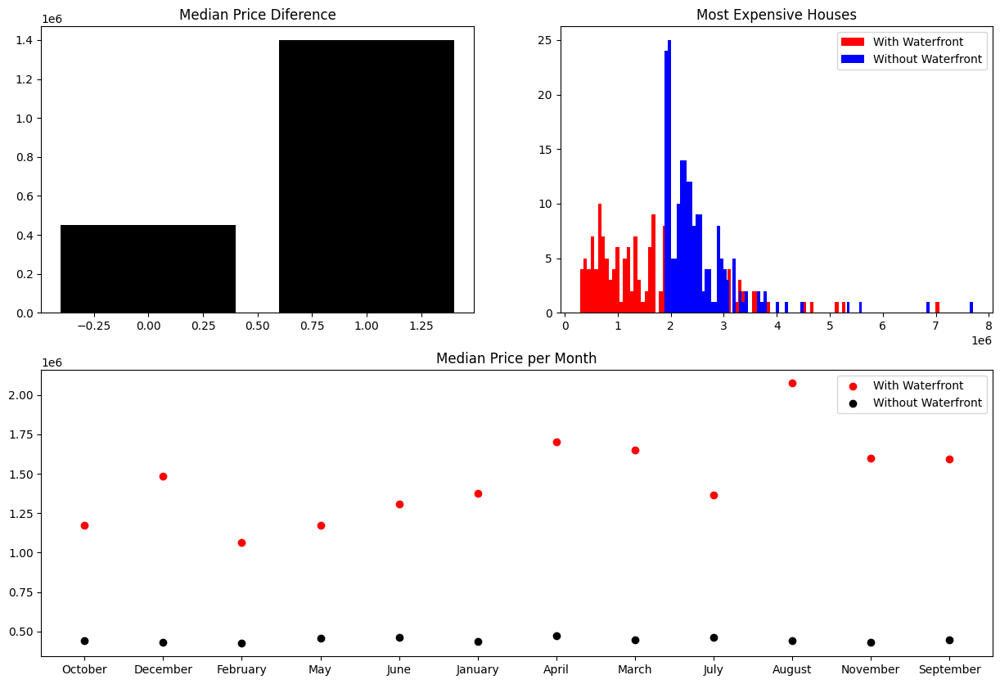

In [420]:
aux2 = df4[df4.waterfront .== 1, :]
aux3 = df4[df4.waterfront .== 0, :]
aux1 = combine(groupby(df4[:, ["waterfront", "price"]], "waterfront"), "price" => median)
aux2 = combine(groupby(aux2[:, ["price", "month_name"]], "month_name"), "price" => median)
aux3 = combine(groupby(aux3[:, ["price", "month_name"]], "month_name"), "price" => median)

plot_price_waterfront(aux1, aux2, aux3)

### **H2.** Casas vendidas em feriados natalinos possuem um preço maior.
**Falsa** Idependente da estação do ano as vendas são da mesma forma.

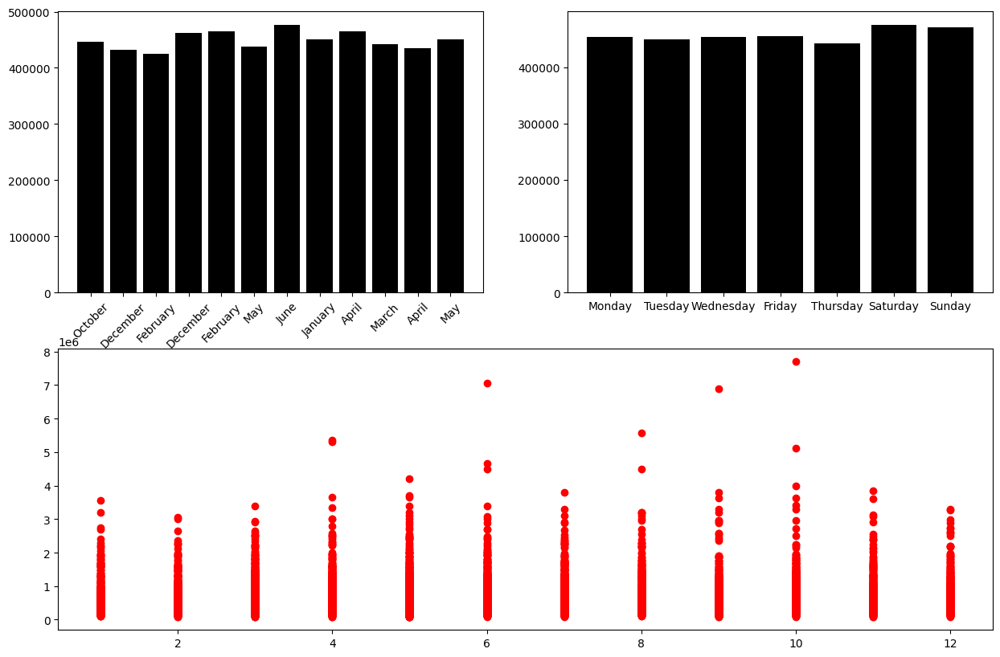

In [443]:
aux = combine(groupby(df4[:, ["month_name", "price"]], "month_name"), "price" => median)
aux2 = combine(groupby(df4[:, ["day_name", "price"]], "day_name"), "price" => median)

plot_price_month(aux1, aux2)

### **H3.** Os preços das casas cresçe a cada ano. 
**Falso** Os preços das casas não alteram ao decorrer dos anos.

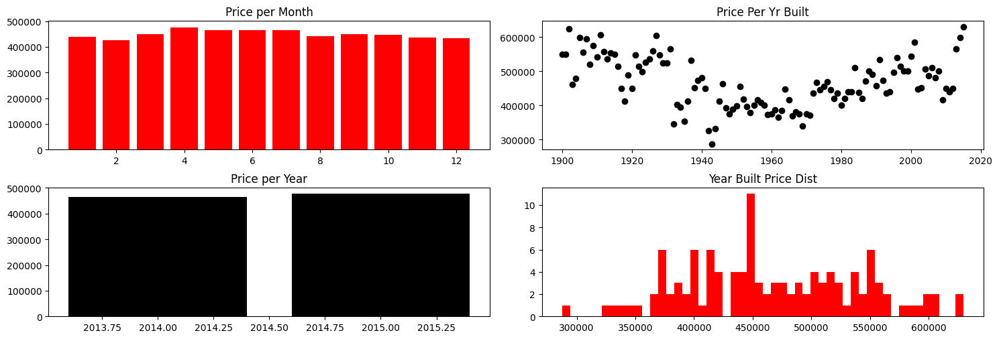

In [31]:
aux1 = combine(groupby(df4[:, ["year", "month", "price"]], ["month", "year"]), "price" => median)
aux2 = combine(groupby(df4[:, ["yr_built", "price"]], "yr_built"), "price" => median)

plot_year_price(aux1, aux2)

### **H4.** Casas com condições melhores possuem uma média de preço maior.
**Verdadeiro** Casas com condições melhores, possuem um preço mediano e médio maior.

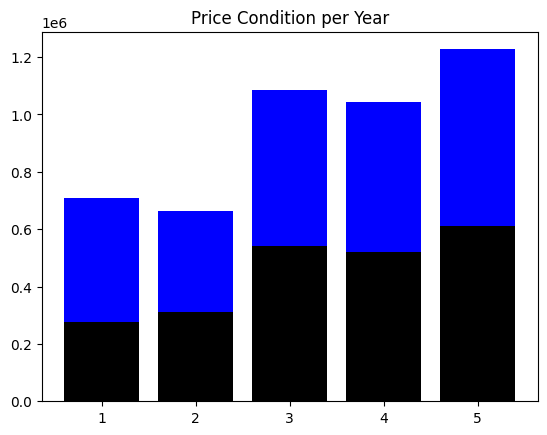

In [136]:
aux3 = combine(groupby(df4[:, ["price", "condition", "year"]], ["year", "condition"]), "price" => mean)
aux31 = aux3[aux3.year .== 2014, :]
aux32 = aux3[aux3.year .== 2015, :]

fig, ax = plt.subplots()
a = ax.bar(aux31.condition, aux31.price_mean, color="k")
b = ax.bar(aux32.condition, aux32.price_mean, bottom=aux31.price_mean, color="b")
ax.set_title("Price Condition per Year");

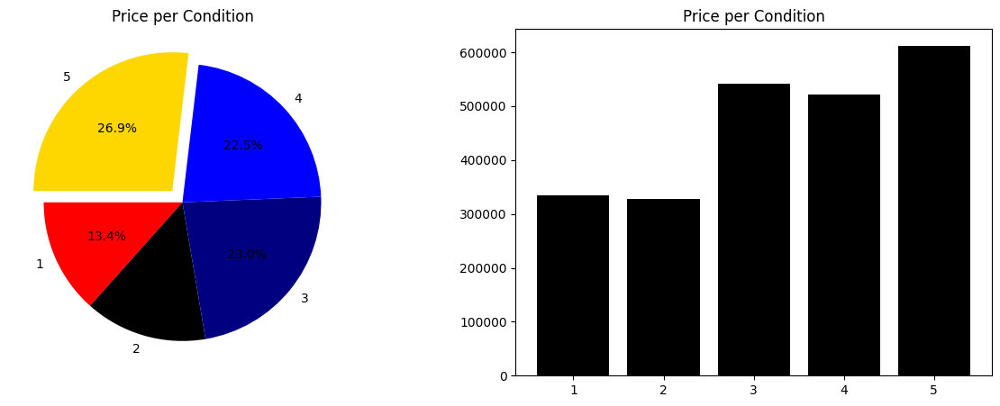

In [85]:
aux1 = combine(groupby(df4[:, ["price", "condition"]], "condition"), "price" => mean)
aux2 = combine(groupby(df4[:, ["price", "condition"]], "condition"), "price" => median)
aux3 = combine(groupby(df4[:, ["price", "condition", "month"]], ["month", "condition"]), "price" => mean)
#s = [round(k, digits=2) for k in aux2.price_median / length(df4.price)];  # Need Check Percent

plot_pie_condition(aux1, aux2);

### **H5.** Casas com mais de dois andares possuem uma mediana de preço maior.
**Verdadeiro** Realmente casas com mais de dois andares possuem uma Mediana de preço Maior, porém, estão em menores quantidades.

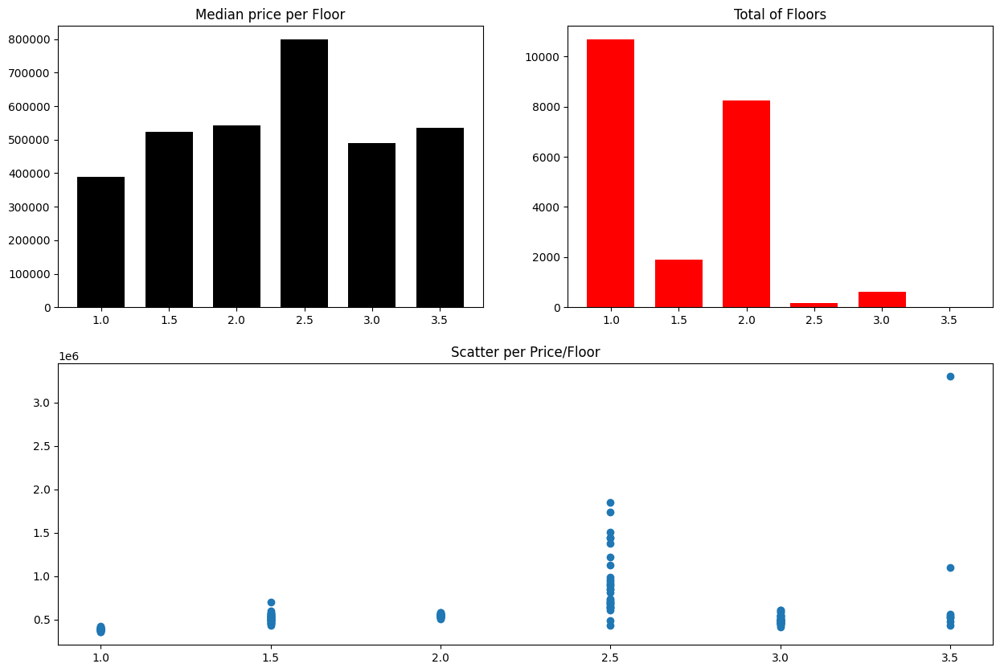

In [70]:
aux1 = combine(groupby(df4[:, ["price", "floors"]], "floors"), "price" => median)
aux12= combine(groupby(df4[:, ["price", "floors"]], "floors"), "floors" => length)
aux2 = combine(groupby(df4[:, ["price", "floors", "day"]], ["floors", "day"]), "price" => median)

plot_price_floors(aux1, aux12, aux2);

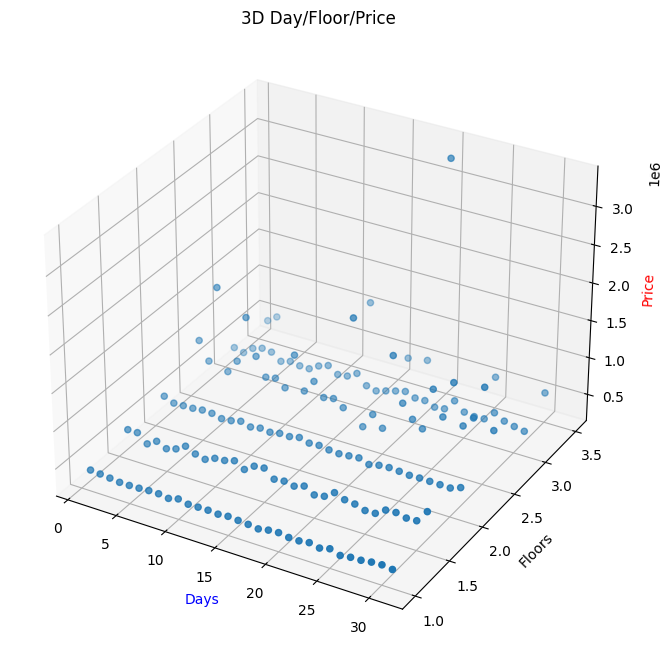

PyObject Text(0.09669153086224506, 0.012954208804733736, 'Price')

In [68]:
plot_3d_day_fig(aux2)

### **H6.** Casas contruidas antes do século XXI possuem uma mediana de preço menor.

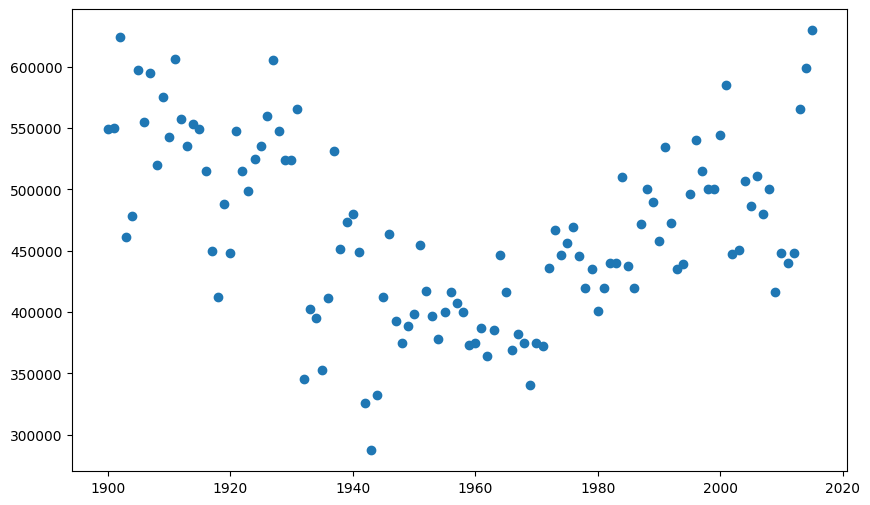

PyObject <matplotlib.collections.PathCollection object at 0x00000000DA6B2520>

In [6]:
aux1 = combine(groupby(df4[:, ["yr_built", "price"]], "yr_built"), "price" => median);
aux2 = combine(groupby(df4[:, ["yr_built", "price", "condition"]], ["yr_built", "condition"]), "price" => median);

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(aux1.yr_built, aux1.price_median)

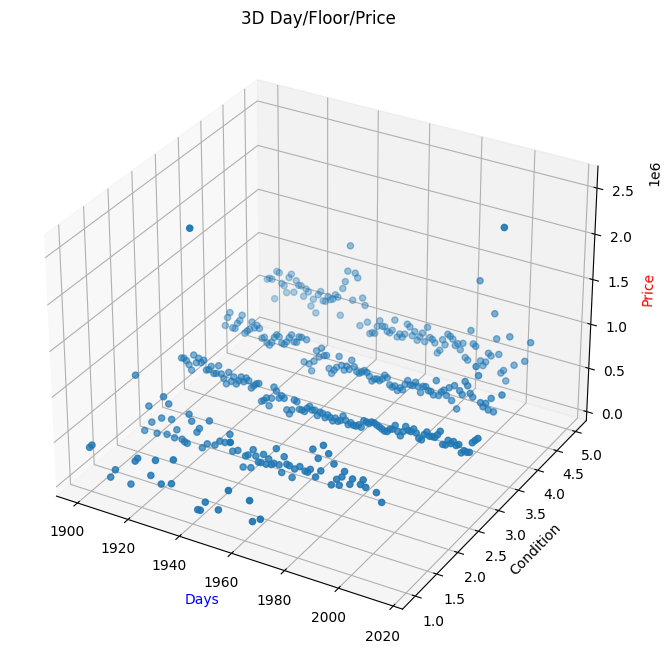

In [7]:
plot_3d_condition_fig(aux2);

### **H7.** Casas com porão representam mais de 50% do preços das casas.
**Falsa** Casas com porão não representam mais de 50% de preço em relação a todos os imóveis.

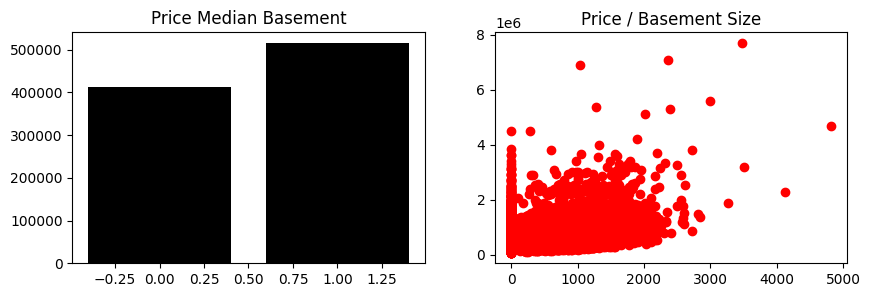

In [134]:
aux1 = df4;
aux1[!, "basement"] = [p > 0 ? 1 : 0 for p in df4.sqft_basement];

aux2 = combine(groupby(aux1[:, ["price", "basement"]], "basement"), "price" => median);

fig, ax = plt.subplots(1, 2, figsize=(10, 3))
ax[1].bar(aux2.basement, aux2.price_median, color="k")
ax[1].set_title("Price Median Basement")
ax[2].scatter(aux1.sqft_basement, aux1.price, c="r")
ax[2].set_title("Price / Basement Size");

## 4.3. Multivariable Analysis

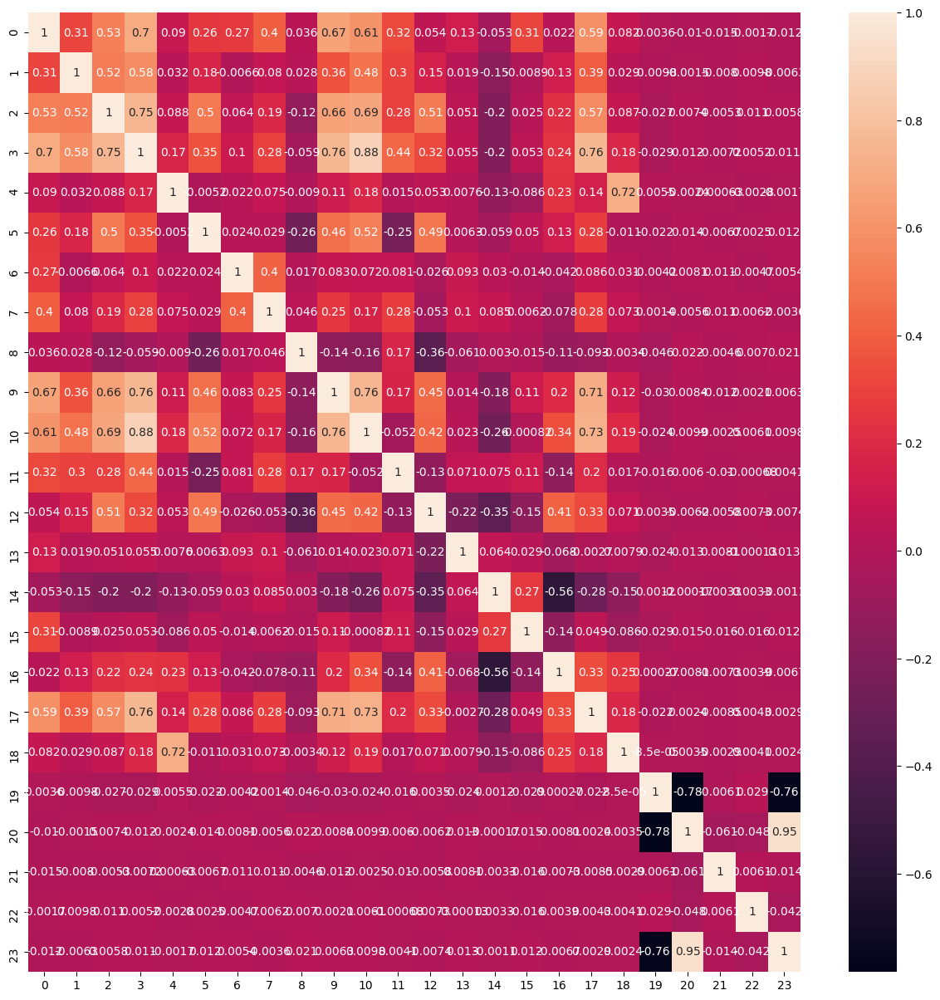

PyObject <AxesSubplot:>

In [217]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(cor(Matrix(df4[:, names(df4)[1:24]])), annot=true, ax=ax)

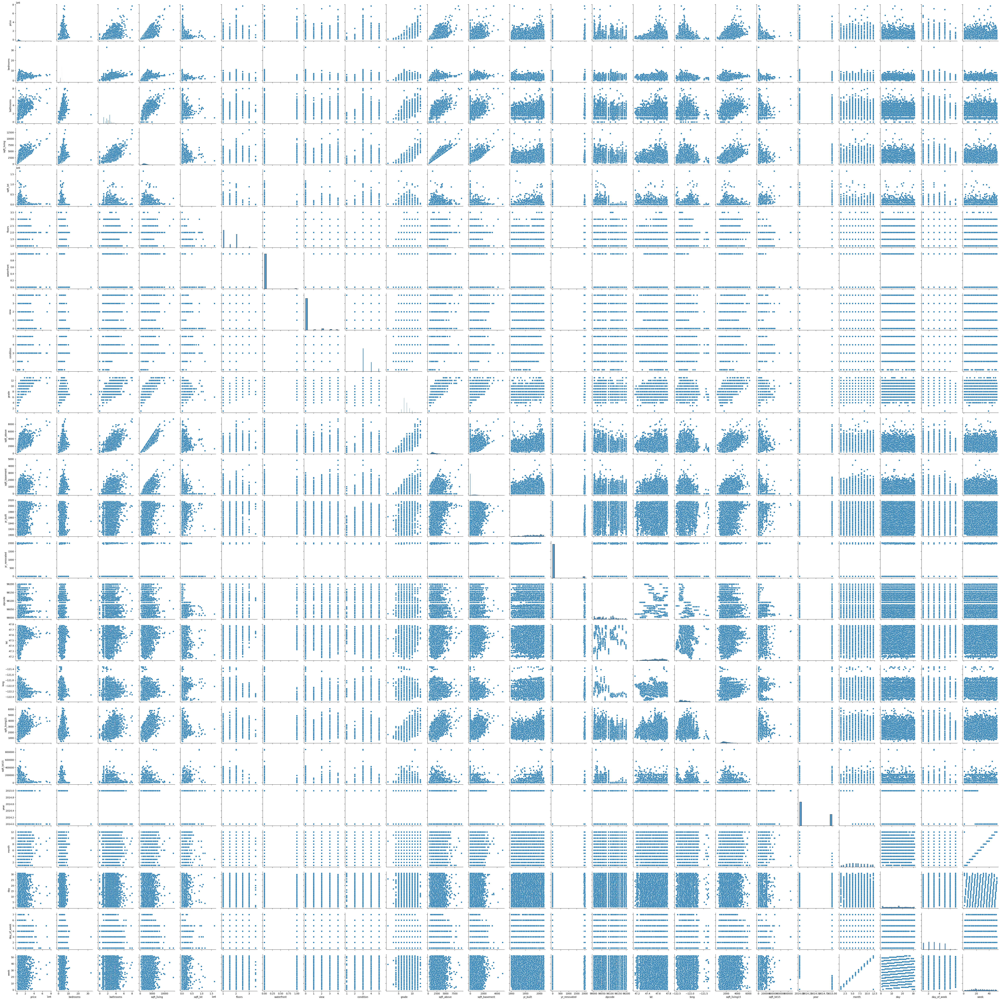

PyObject <seaborn.axisgrid.PairGrid object at 0x000000011838E0D0>

In [229]:
sns.pairplot(pd.read_csv("../data/df3.csv"))